In [1]:
import scimap as sm
import anndata as ad
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os

Running SCIMAP  2.1.1


/opt/anaconda3/envs/scimap/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



In [2]:
outdir = '/Users/cdpolt/Documents/Xenium_Pilot'
fname = 'Xenium Cell Typing.h5ad'
full_path = os.path.join(outdir, fname)

In [3]:
adata = ad.read_h5ad(full_path)

In [4]:
adata

AnnData object with n_obs × n_vars = 694624 × 280
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'batch', 'n_counts', 'leiden', 'Cell Type'
    var: 'gene_ids', 'feature_types', 'genome', 'mean', 'std'
    uns: 'CT_cmap', 'Cell Type_colors', 'dendrogram_Cell Type', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [5]:
adata.obs['X_centroid'] = adata.obs['x_centroid']
adata.obs['Y_centroid'] = adata.obs['y_centroid']

In [6]:
sm.tl.spatial_count(adata, phenotype='Cell Type', method = 'knn', knn=10, label='spatial_count_10', imageid = 'batch')

Identifying the 10 nearest neighbours for every cell
Identifying the 10 nearest neighbours for every cell
Identifying the 10 nearest neighbours for every cell
Identifying the 10 nearest neighbours for every cell
Identifying the 10 nearest neighbours for every cell
Identifying the 10 nearest neighbours for every cell
Identifying the 10 nearest neighbours for every cell
Identifying the 10 nearest neighbours for every cell


AnnData object with n_obs × n_vars = 694624 × 280
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'batch', 'n_counts', 'leiden', 'Cell Type', 'X_centroid', 'Y_centroid'
    var: 'gene_ids', 'feature_types', 'genome', 'mean', 'std'
    uns: 'CT_cmap', 'Cell Type_colors', 'dendrogram_Cell Type', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'spatial_count_10'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [7]:
sm.tl.spatial_cluster(adata, df_name='spatial_count_10', method = 'kmeans', k=30, label='neigh10_kmeans30')

Kmeans clustering


AnnData object with n_obs × n_vars = 694624 × 280
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'batch', 'n_counts', 'leiden', 'Cell Type', 'X_centroid', 'Y_centroid', 'neigh10_kmeans30'
    var: 'gene_ids', 'feature_types', 'genome', 'mean', 'std'
    uns: 'CT_cmap', 'Cell Type_colors', 'dendrogram_Cell Type', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'spatial_count_10'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

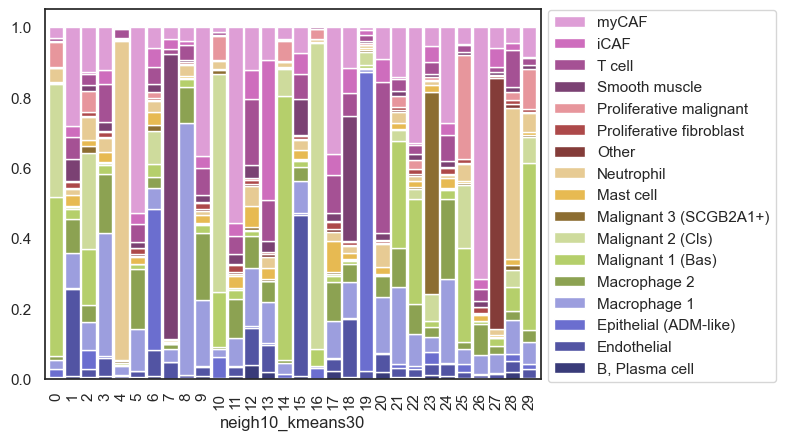

In [118]:
sm.pl.stacked_barplot(adata, x_axis='neigh10_kmeans30', y_axis = 'Cell Type', order_xaxis = ['0','1','2','3','4','5','6','7','8','9',
                      '10','11','12','13','14','15','16','17','18','19', '20','21','22','23','24','25','26','27','28','29'], 
                      matplotlib_cmap= 'tab20b',)

In [114]:
sm.pl.stacked_barplot(adata, x_axis='neigh10_kmeans30', y_axis = 'Cell Type', order_xaxis = ['0','1','2','3','4','5','6','7','8','9',
                      '10','11','12','13','14','15','16','17','18','19', '20','21','22','23','24','25','26','27','28','29'], 
                      matplotlib_cmap= 'tab20b', saveDir = outdir, fileName = 'kmeans30_barplot.png')

Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/kmeans30_barplot.png


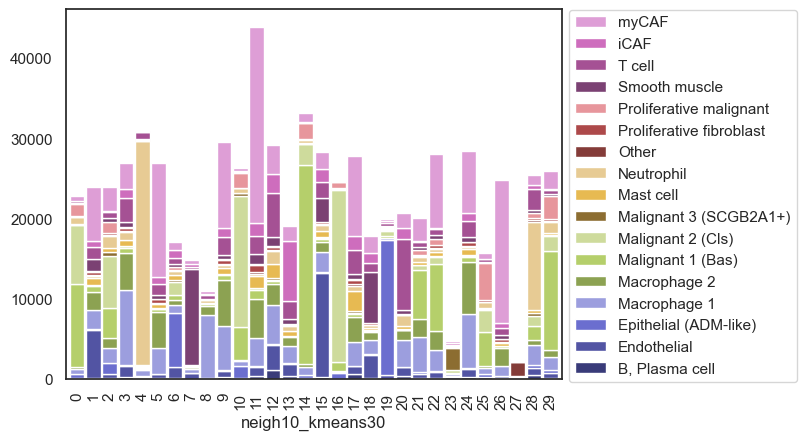

In [9]:
sm.pl.stacked_barplot(adata, x_axis='neigh10_kmeans30', y_axis = 'Cell Type', order_xaxis = ['0','1','2','3','4','5','6','7','8','9',
                      '10','11','12','13','14','15','16','17','18','19', '20','21','22','23','24','25','26','27','28','29'], 
                      method = 'absolute', matplotlib_cmap= 'tab20b')

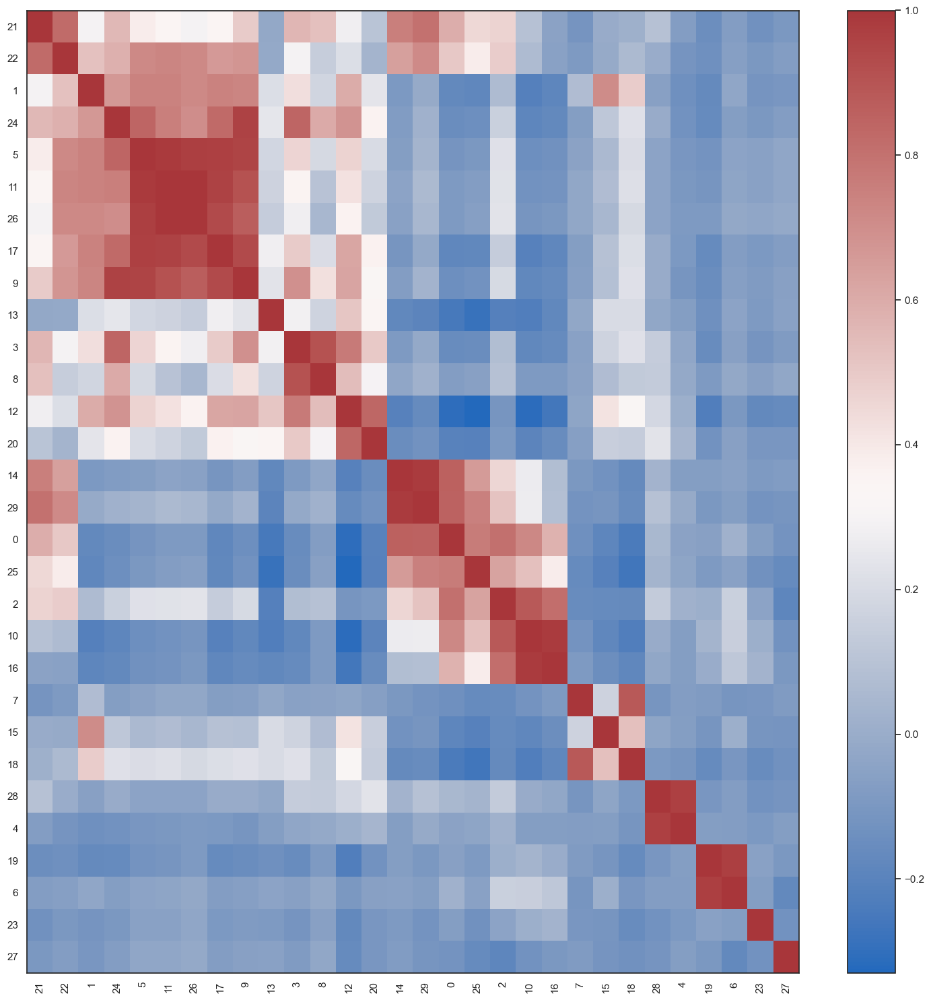

In [120]:
sm.pl.groupCorrelation(adata, groupBy='neigh10_kmeans30', condition='Cell Type', )

In [116]:
sm.pl.groupCorrelation(adata, groupBy='neigh10_kmeans30', condition='Cell Type', saveDir = outdir, fileName = 'kmeans30_corrplot.png')

Saved heatmap to /Users/cdpolt/Documents/Xenium_Pilot/kmeans30_corrplot.png


In [11]:
rename_dict = {'Mixed Cls/Bas malignant': ['0', '2'],
               'Endothelial': ['1', '15'],
               'Macrophage-enriched stroma': ['3', '9', '24'],
               'Neutrophil aggregate': ['4', '28'],
               'myCAF-enriched stroma': ['5', '11', '26'],
               'ADM-like epithelial': ['6', '19'],
               'Smooth muscle': ['7', '18'],
               'Macrophage aggregate': ['8'],
               'Classical-like malignant': ['10', '16'],
               'Mast cell-enriched stroma': ['12', '17'],
               'iCAF-enriched stroma': ['13'],
               'Basal-like malignant': ['14', '29'],
               'T cell-enriched stroma': ['20'],
               'Basal-like/stroma interface': ['21', '22'],
               'SCGB2A1+ malignant': ['23'],
               'Proliferating malignant': ['25'],
               'Other-enriched': ['27']
              }
               

adata = sm.hl.rename(adata, rename=rename_dict, from_column='neigh10_kmeans30', to_column='Cellular Neighborhoods')

Renaming 0 to Mixed Cls/Bas malignant
Renaming 2 to Mixed Cls/Bas malignant
Renaming 1 to Endothelial
Renaming 15 to Endothelial
Renaming 3 to Macrophage-enriched stroma
Renaming 9 to Macrophage-enriched stroma
Renaming 24 to Macrophage-enriched stroma
Renaming 4 to Neutrophil aggregate
Renaming 28 to Neutrophil aggregate
Renaming 5 to myCAF-enriched stroma
Renaming 11 to myCAF-enriched stroma
Renaming 26 to myCAF-enriched stroma
Renaming 6 to ADM-like epithelial
Renaming 19 to ADM-like epithelial
Renaming 7 to Smooth muscle
Renaming 18 to Smooth muscle
Renaming 8 to Macrophage aggregate
Renaming 10 to Classical-like malignant
Renaming 16 to Classical-like malignant
Renaming 12 to Mast cell-enriched stroma
Renaming 17 to Mast cell-enriched stroma
Renaming 13 to iCAF-enriched stroma
Renaming 14 to Basal-like malignant
Renaming 29 to Basal-like malignant
Renaming 20 to T cell-enriched stroma
Renaming 21 to Basal-like/stroma interface
Renaming 22 to Basal-like/stroma interface
Renaming 23

In [12]:
def generate_cmap_dict(labels, colormap):
    unique_labels = sorted(labels.unique())
    cmap = plt.get_cmap(colormap, len(unique_labels))
    colors = [cmap(i) for i in range(cmap.N)]
    hex_colors = [mcolors.rgb2hex(color) for color in colors]
    color_dict = dict(zip(unique_labels, hex_colors))
    return color_dict

# Generate colormap dictionary for Cellular Neighborhoods
cellular_neighborhoods = adata.obs['Cellular Neighborhoods']
CN_cmap = generate_cmap_dict(cellular_neighborhoods, 'tab20b')

# Store the colormap dictionary in adata.uns
adata.uns['CN_cmap'] = CN_cmap

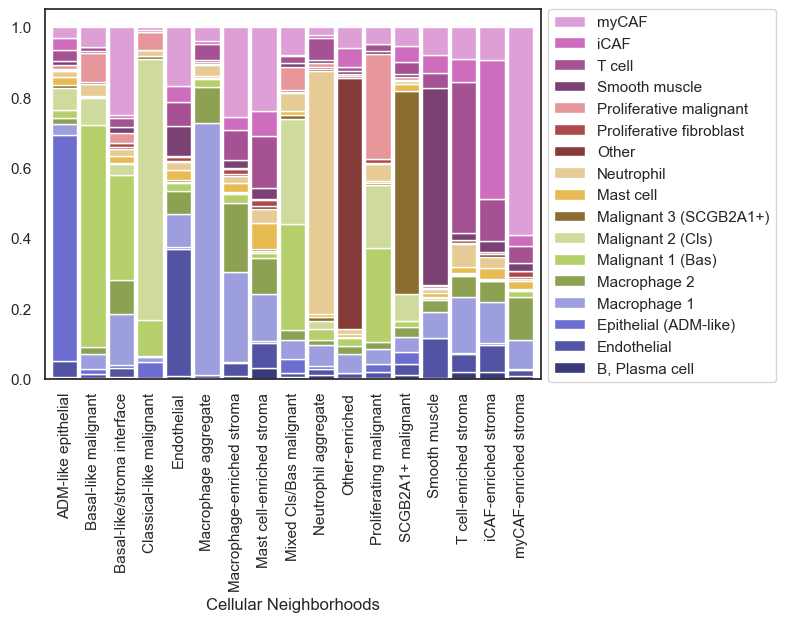

In [13]:
sm.pl.stacked_barplot(adata, x_axis='Cellular Neighborhoods', y_axis = 'Cell Type', matplotlib_cmap= 'tab20b')

In [122]:
sm.pl.stacked_barplot(adata, x_axis='Cellular Neighborhoods', y_axis = 'Cell Type', matplotlib_cmap= 'tab20b', 
                      saveDir = outdir, fileName = 'CN_barplot.png')

Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/CN_barplot.png


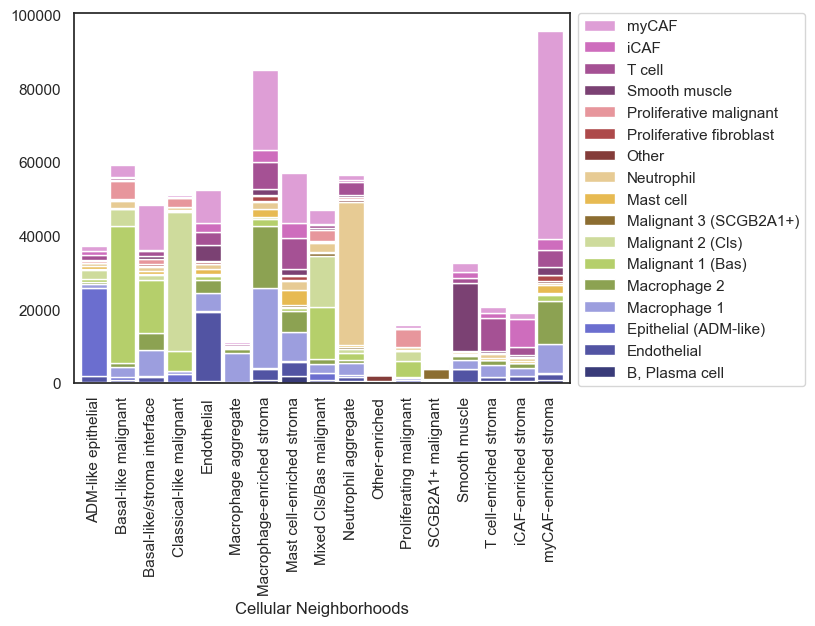

In [14]:
sm.pl.stacked_barplot(adata, x_axis='Cellular Neighborhoods', y_axis = 'Cell Type', method = 'absolute', matplotlib_cmap='tab20b')

In [15]:
CT_cmap = adata.uns['CT_cmap']
CN_cmap = adata.uns['CN_cmap']

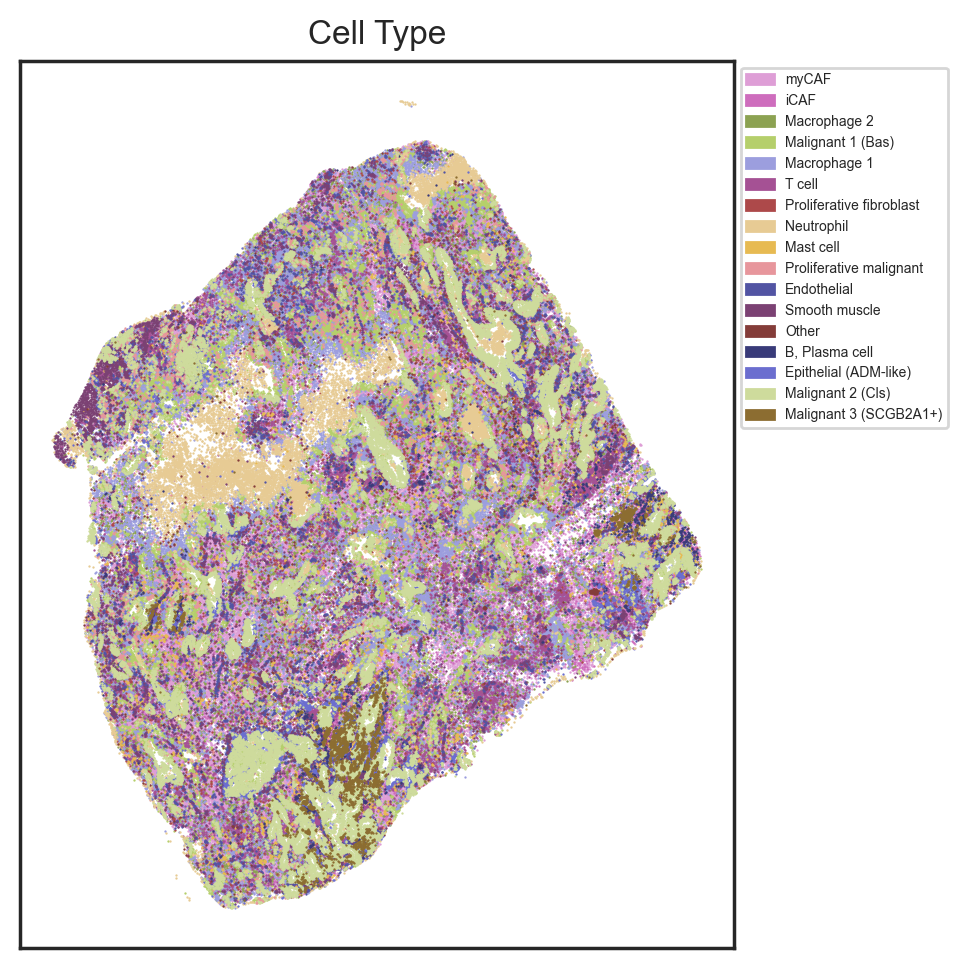

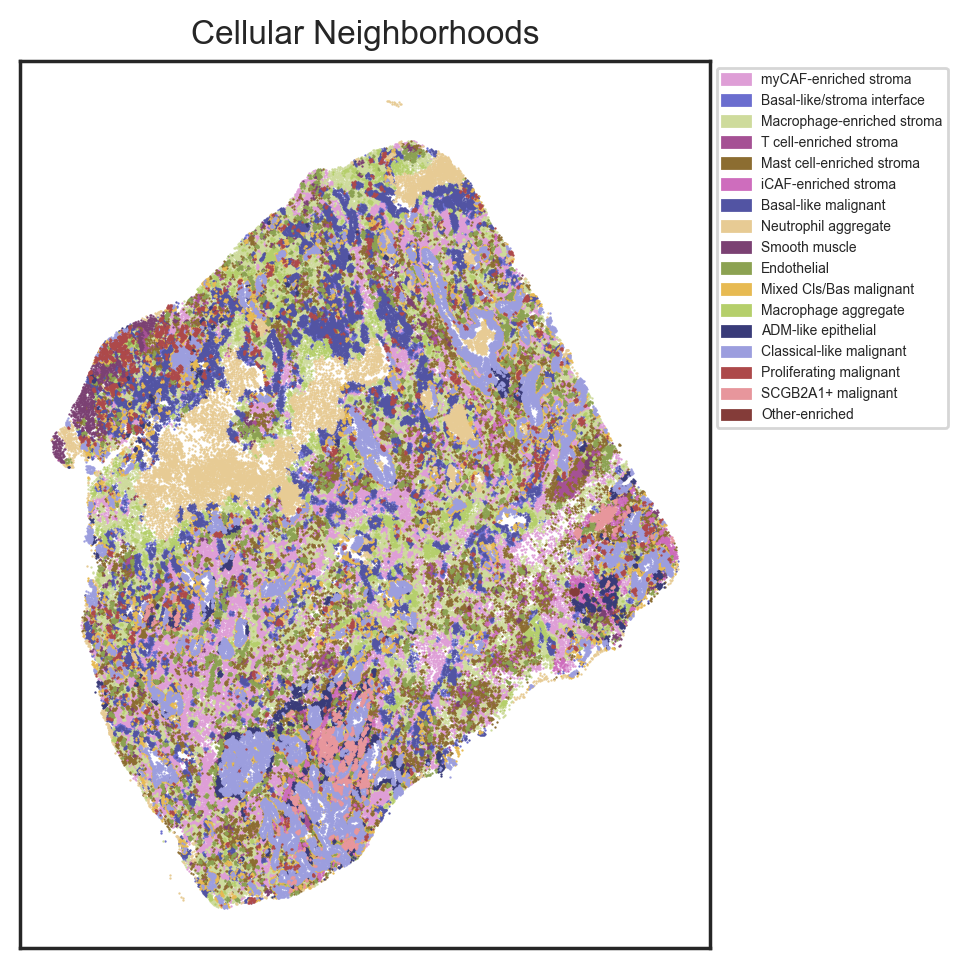

In [18]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '0', customColors = CT_cmap)
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '0', customColors = CN_cmap)

In [19]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '0', customColors = CT_cmap, saveDir = outdir, fileName = 'spatial_CT_0')
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '0', customColors = CN_cmap, saveDir = outdir, fileName = 'spatial_CN_0')

Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CT_0
Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CN_0


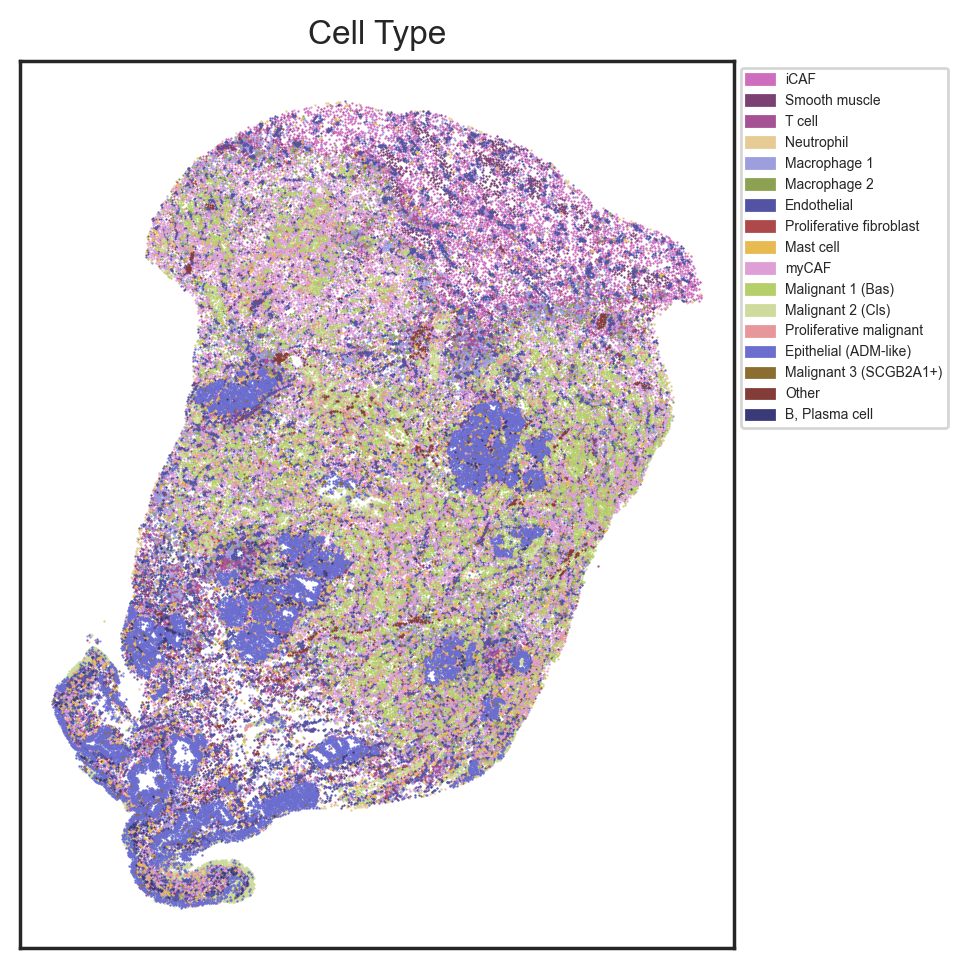

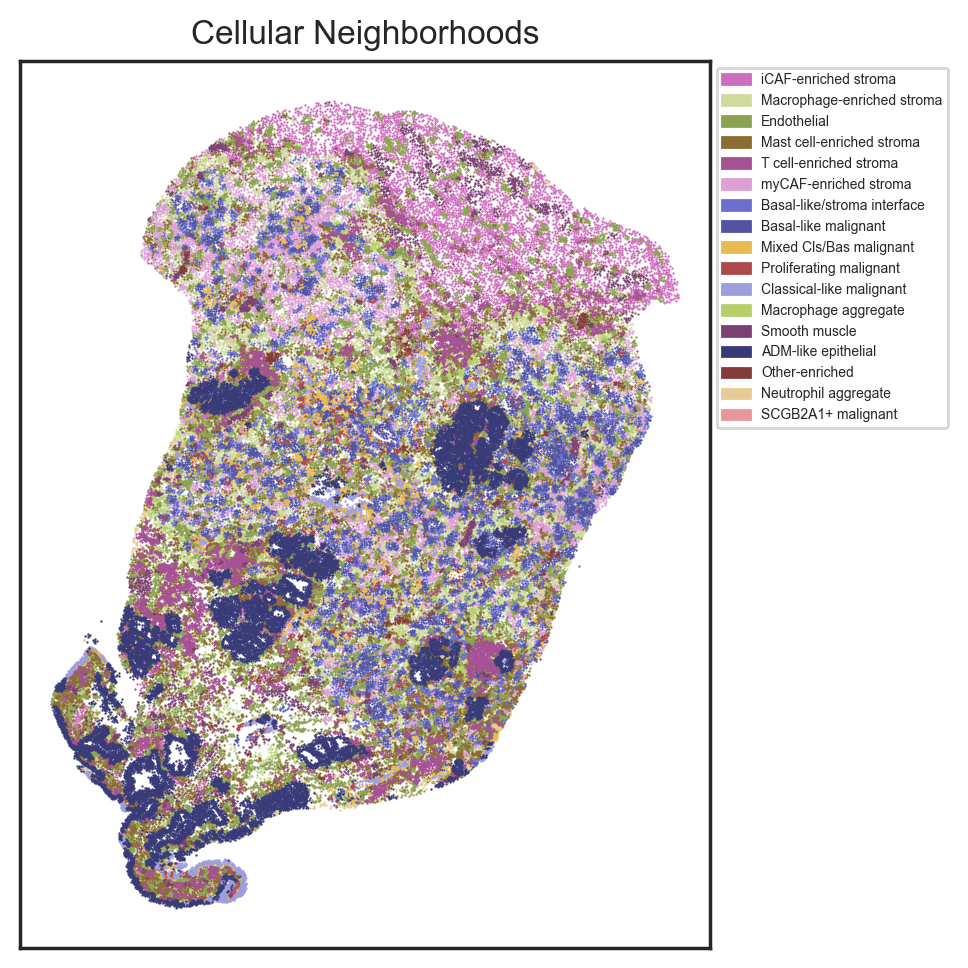

In [20]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '1', customColors = CT_cmap )
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '1', customColors = CN_cmap )

In [21]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '1', customColors = CT_cmap, saveDir = outdir, fileName = 'spatial_CT_1')
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '1', customColors = CN_cmap, saveDir = outdir, fileName = 'spatial_CN_1')

Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CT_1
Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CN_1


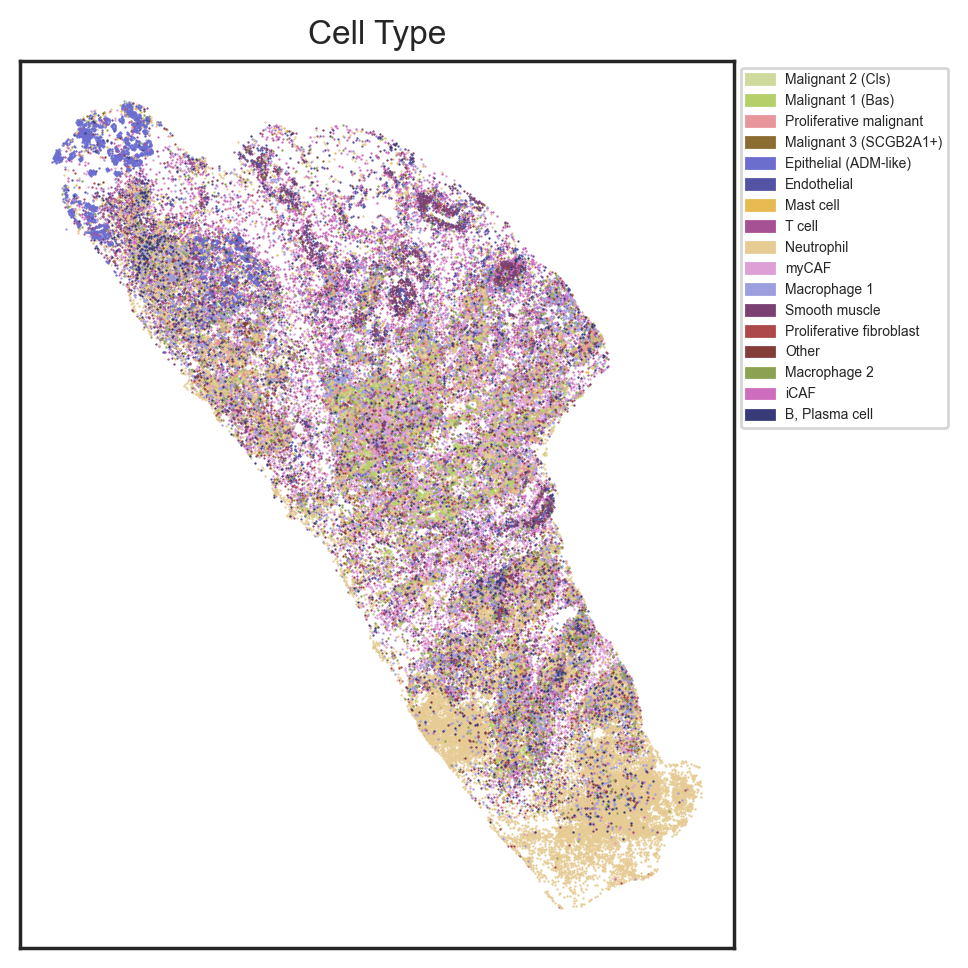

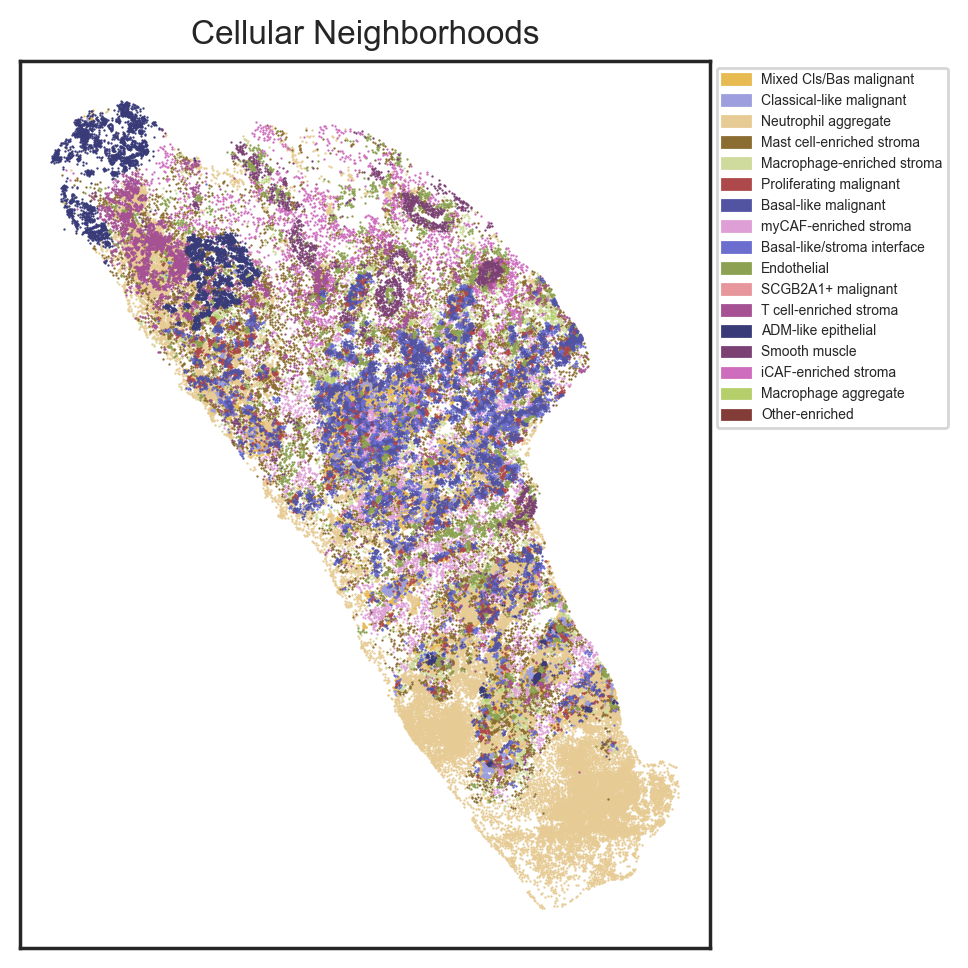

In [22]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '2', customColors = CT_cmap )
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '2', customColors = CN_cmap )

In [23]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '2', customColors = CT_cmap, saveDir = outdir, fileName = 'spatial_CT_2')
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '2', customColors = CN_cmap, saveDir = outdir, fileName = 'spatial_CN_2')

Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CT_2
Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CN_2


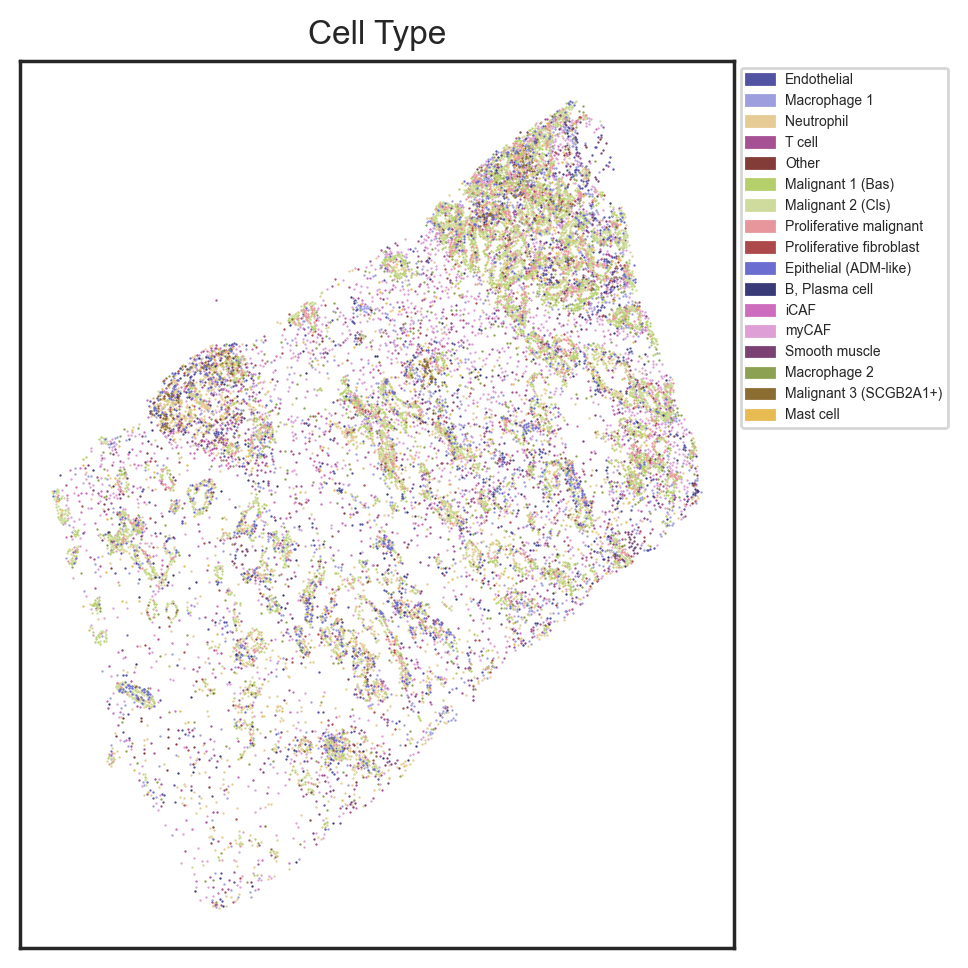

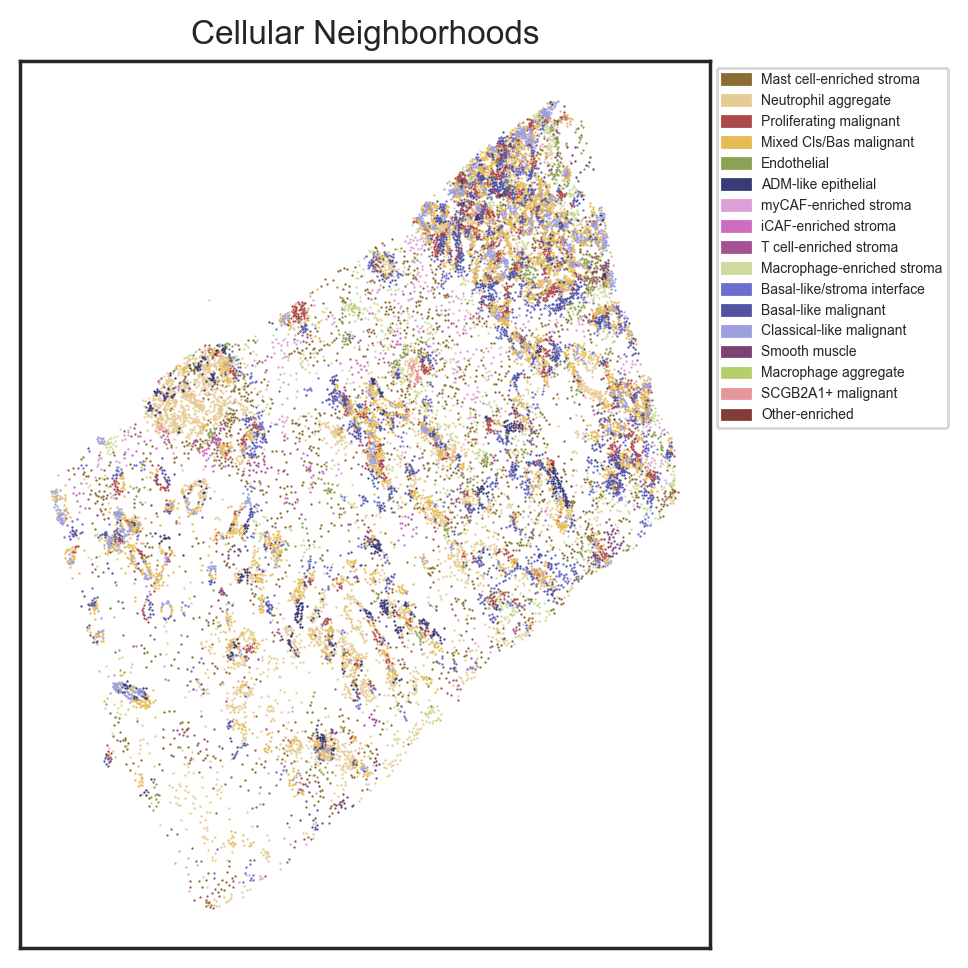

In [24]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '3', customColors = CT_cmap, )
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '3', customColors = CN_cmap, )

In [28]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '3', customColors = CT_cmap, saveDir = outdir, fileName = 'spatial_CT_3')
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '3', customColors = CN_cmap, saveDir = outdir, fileName = 'spatial_CN_3')

Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CT_3
Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CN_3


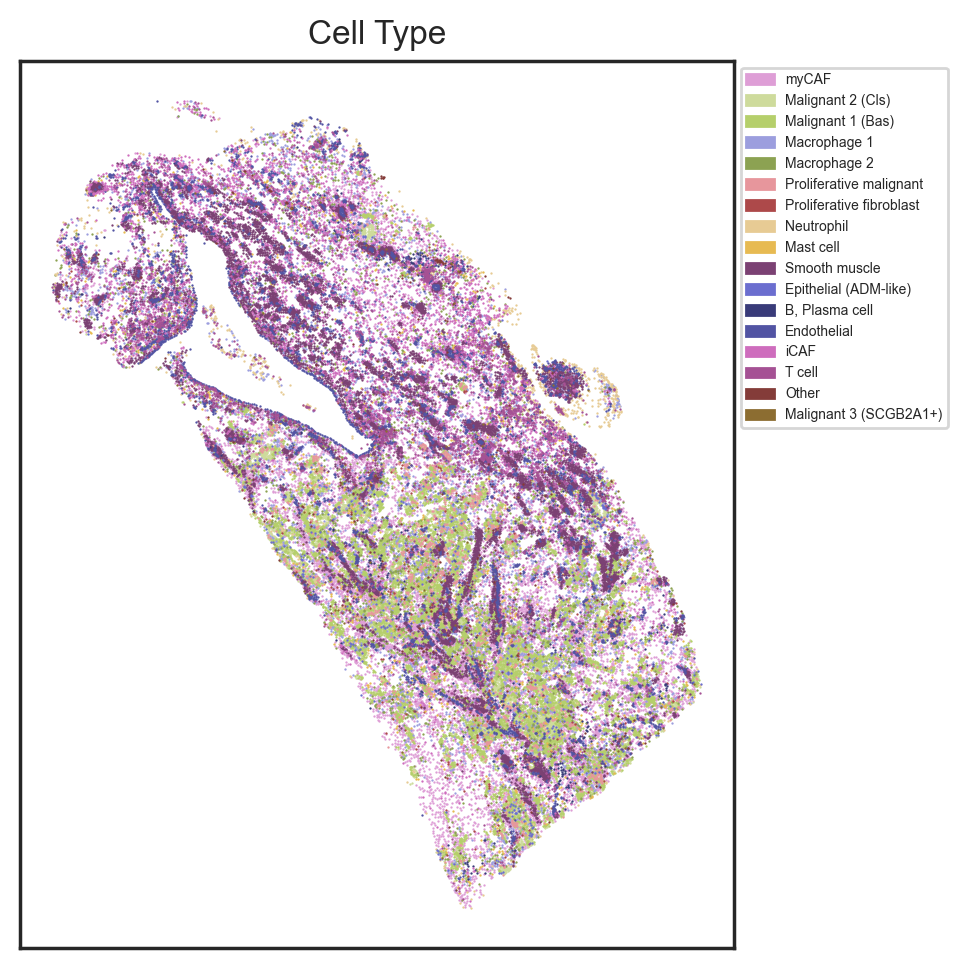

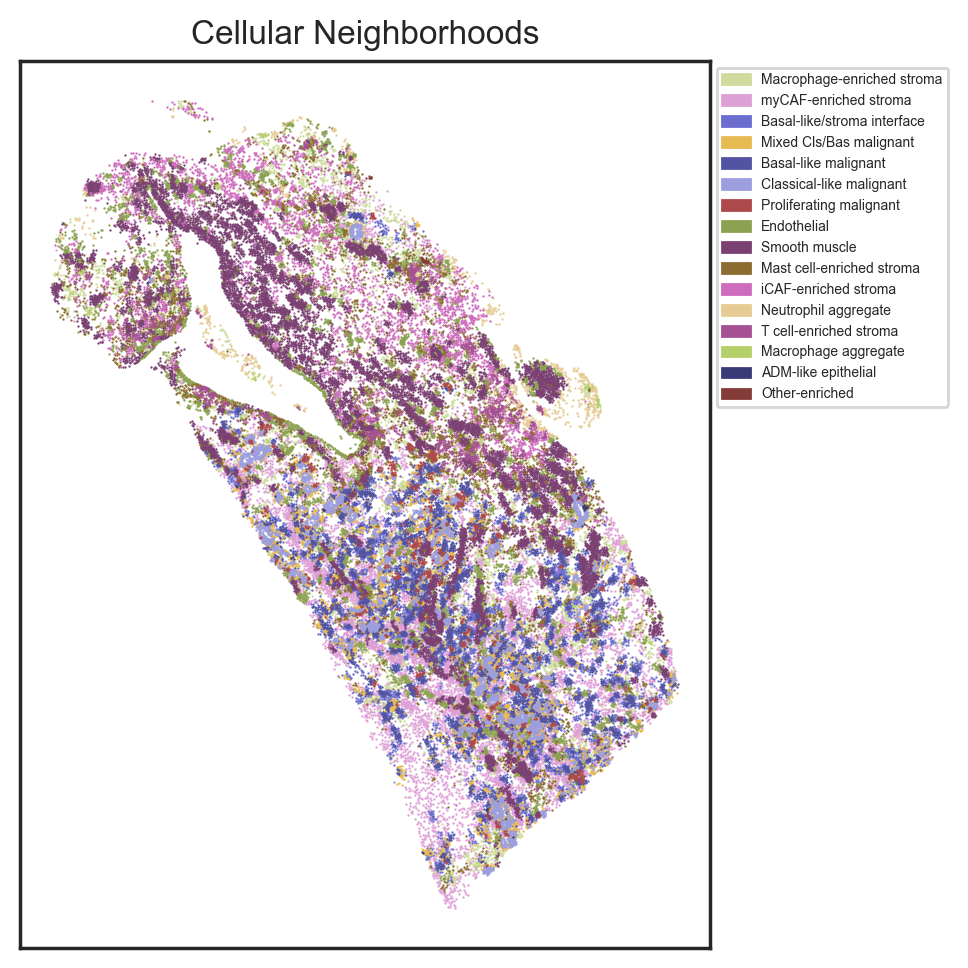

In [29]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '4', customColors = CT_cmap, )
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '4', customColors = CN_cmap, )

In [30]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '4', customColors = CT_cmap, saveDir = outdir, fileName = 'spatial_CT_4')
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '4', customColors = CN_cmap, saveDir = outdir, fileName = 'spatial_CN_4')

Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CT_4
Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CN_4


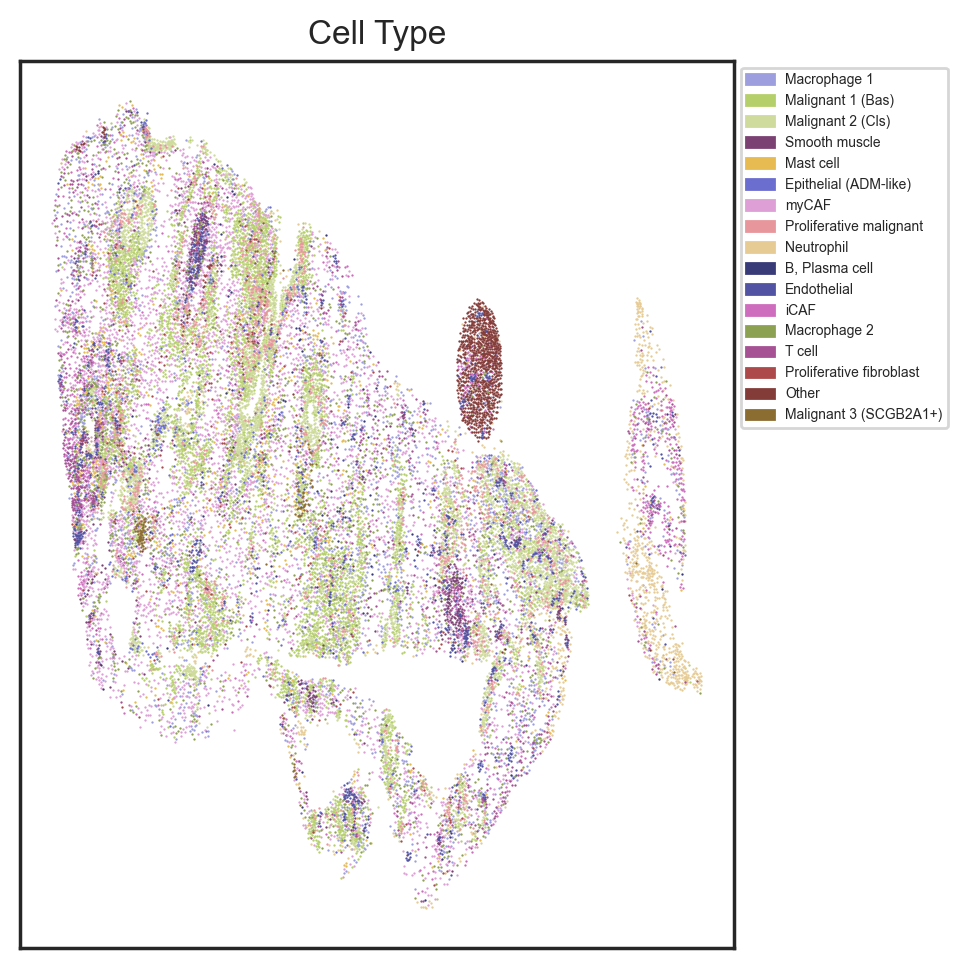

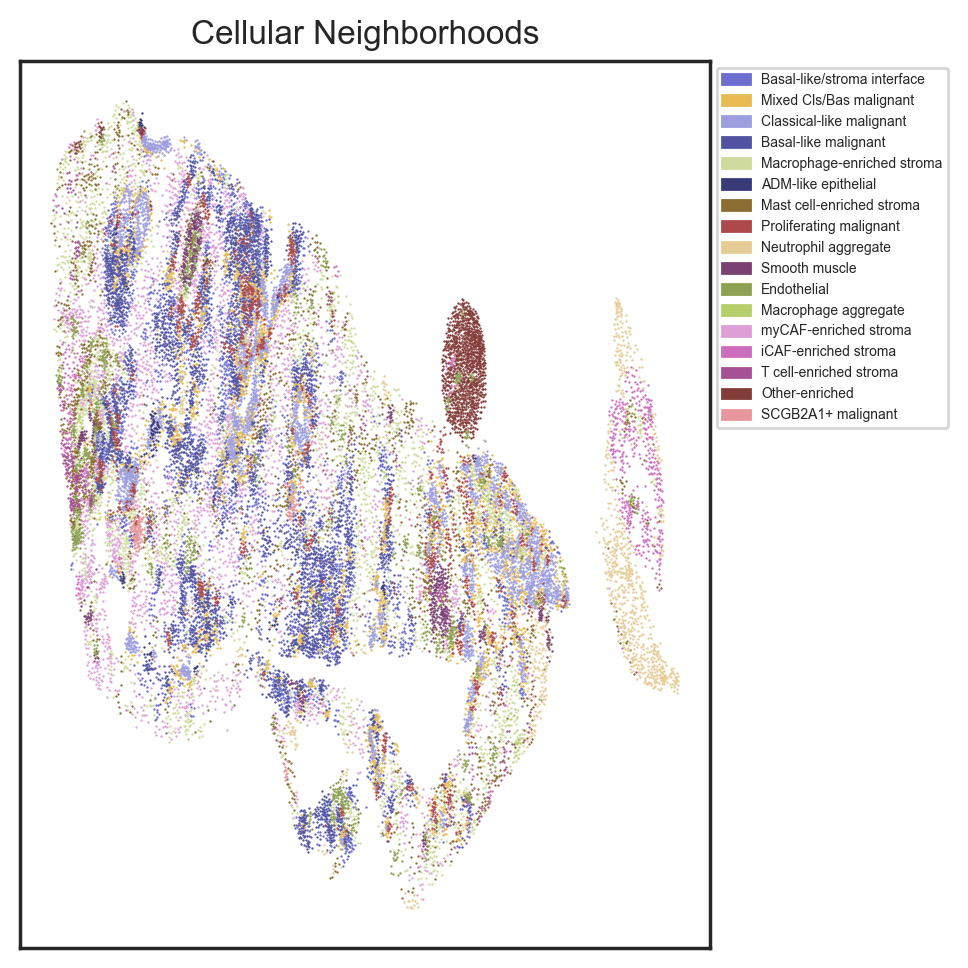

In [31]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '5', customColors = CT_cmap, )
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '5', customColors = CN_cmap, )

In [32]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '5', customColors = CT_cmap, saveDir = outdir, fileName = 'spatial_CT_5')
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '5', customColors = CN_cmap, saveDir = outdir, fileName = 'spatial_CN_5')

Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CT_5
Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CN_5


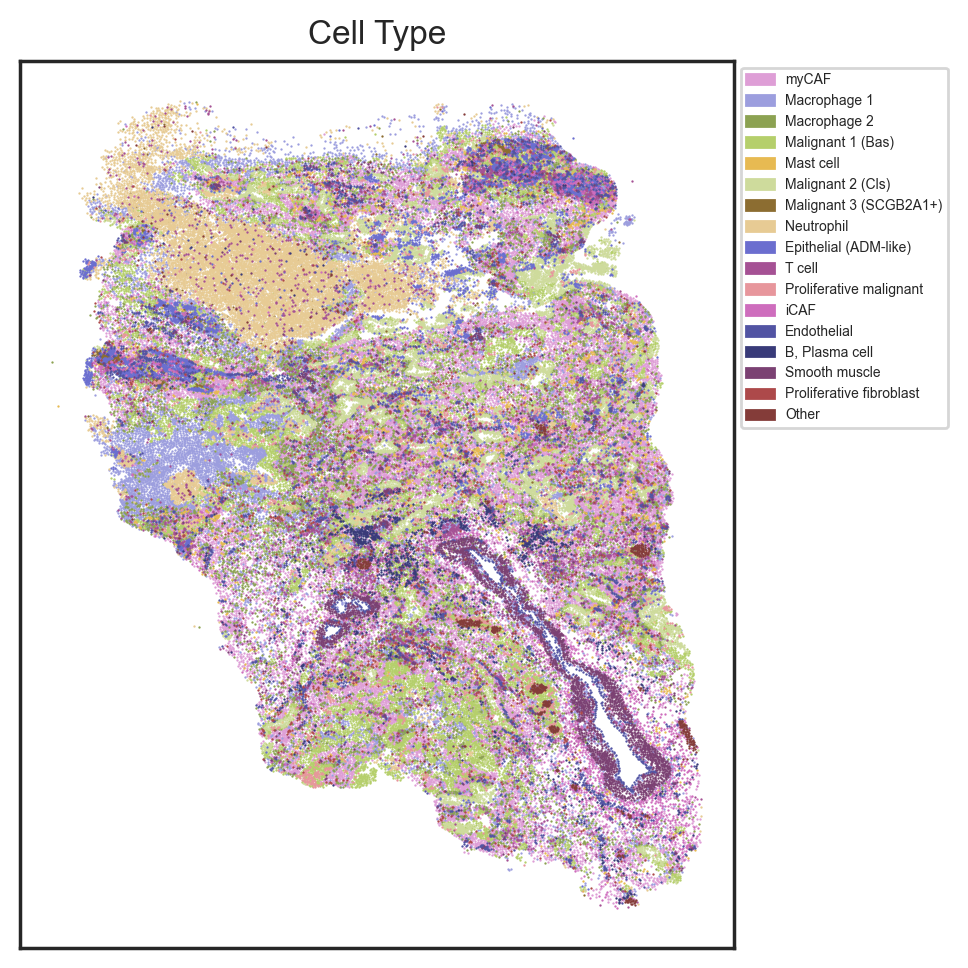

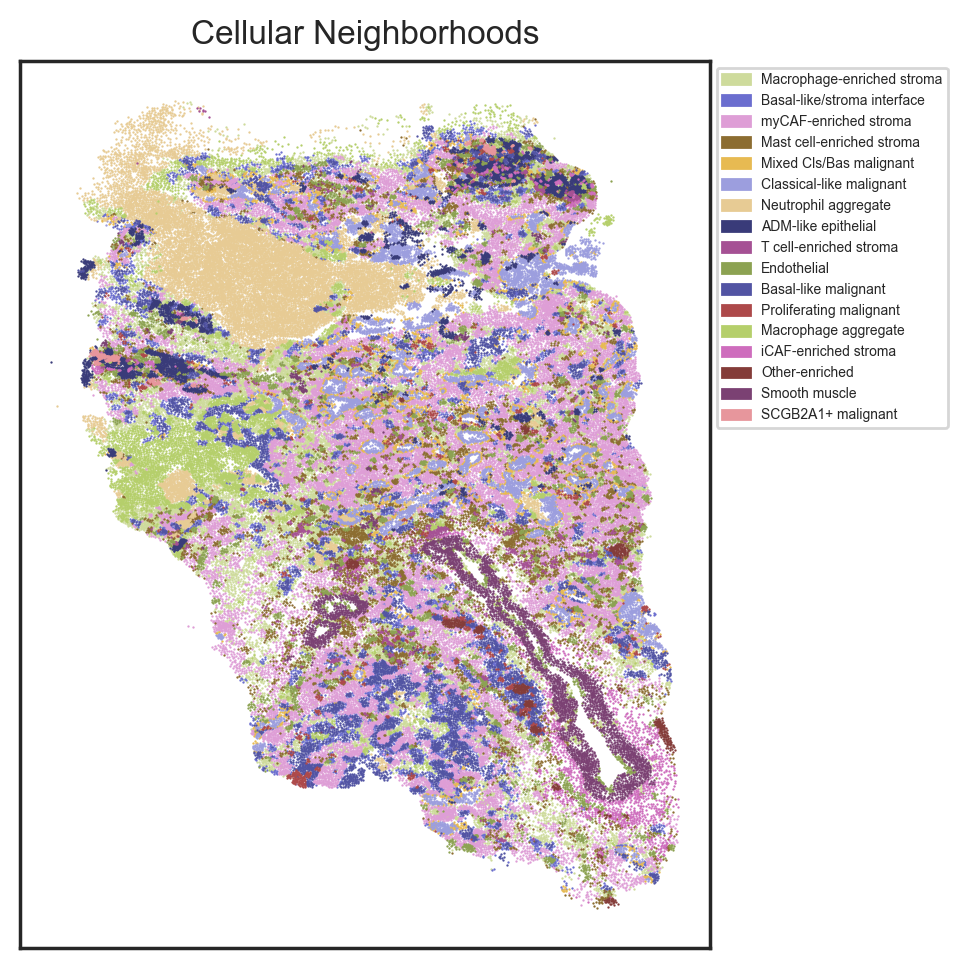

In [33]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '6', customColors = CT_cmap, )
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '6', customColors = CN_cmap, )

In [34]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '6', customColors = CT_cmap, saveDir = outdir, fileName = 'spatial_CT_6')
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '6', customColors = CN_cmap, saveDir = outdir, fileName = 'spatial_CN_6')

Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CT_6
Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CN_6


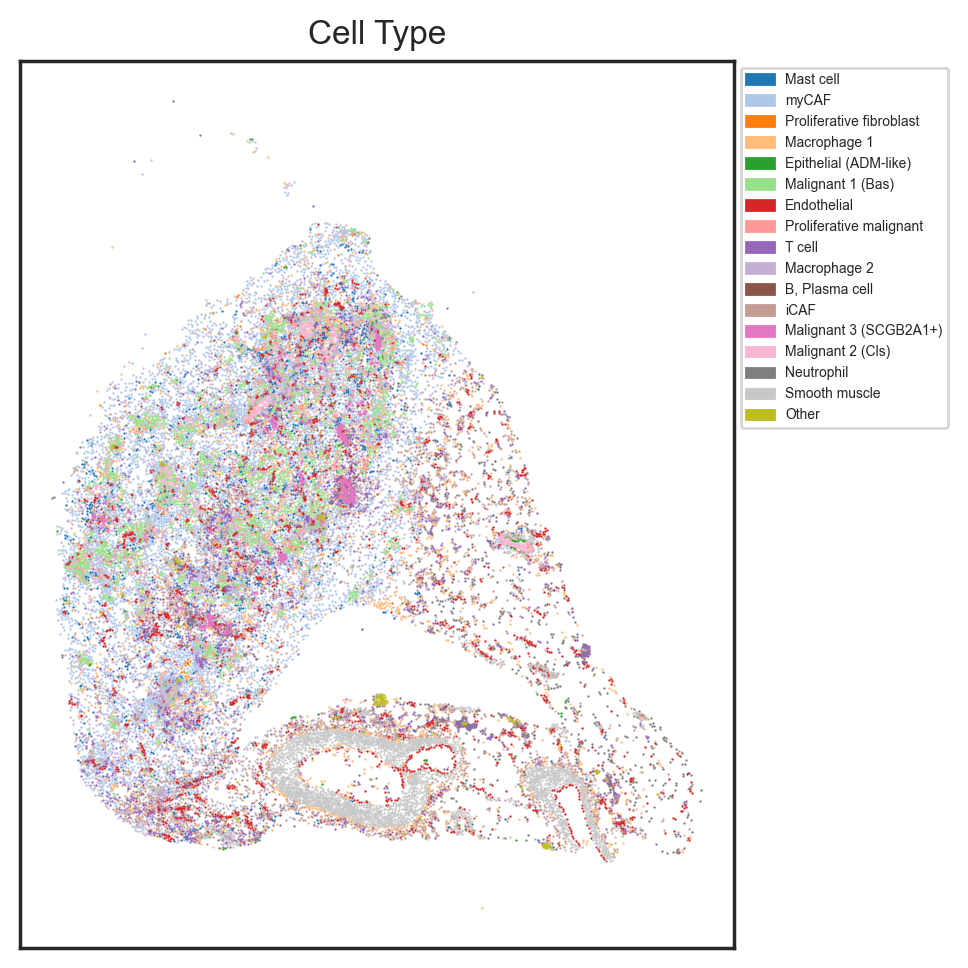

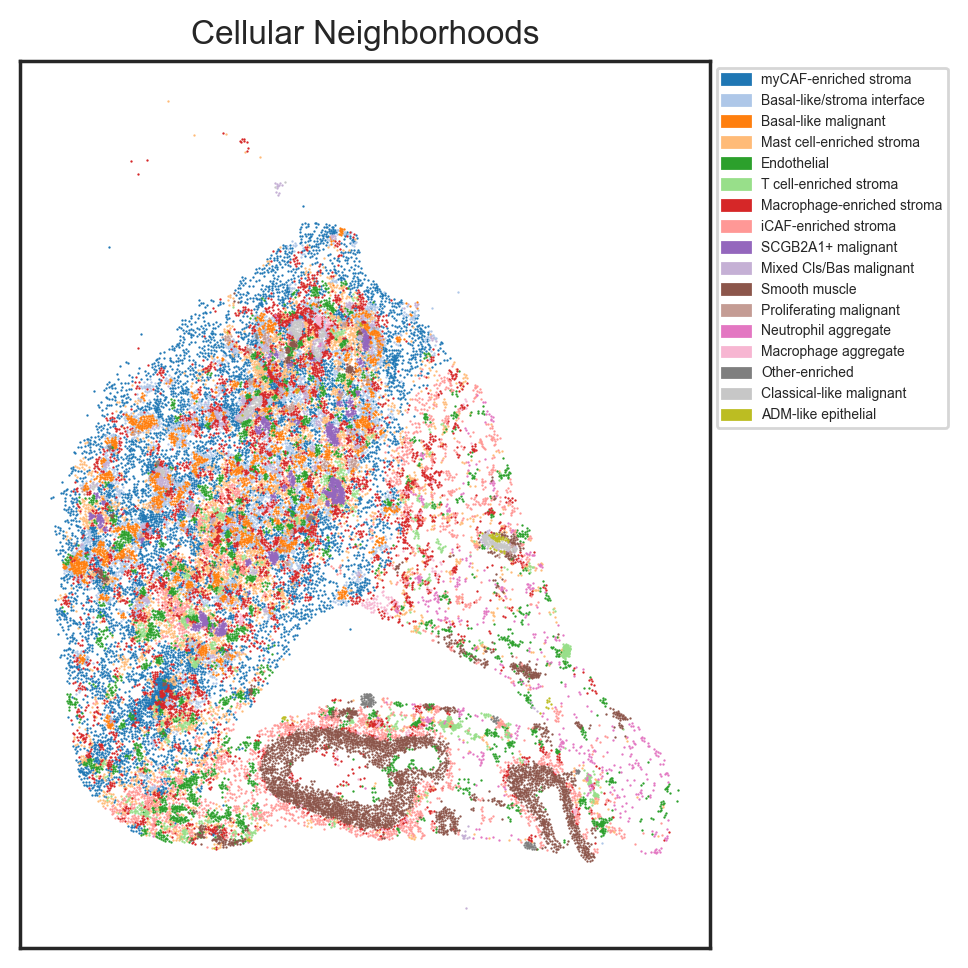

In [35]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '7', )
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '7', )

In [36]:
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cell Type' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '7', saveDir = outdir, fileName = 'spatial_CT_7')
sm.pl.spatial_scatterPlot(adata, colorBy = 'Cellular Neighborhoods' , s=0.7, fontsize=5, imageid = 'batch',
                         subset = '7', saveDir = outdir, fileName = 'spatial_CN_7')

Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CT_7
Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/spatial_CN_7


In [63]:
adata = sm.tl.spatial_distance(adata, phenotype = 'Cell Type', imageid = 'batch', label = 'spatial_distance_CT')

Processing Image: 0
Processing Image: 1
Processing Image: 2
Processing Image: 3
Processing Image: 4
Processing Image: 5
Processing Image: 6
Processing Image: 7


In [65]:
adata = sm.tl.spatial_distance(adata, phenotype = 'Cellular Neighborhoods', imageid = 'batch', label = 'spatial_distance_RCN')

Processing Image: 0
Processing Image: 1
Processing Image: 2
Processing Image: 3
Processing Image: 4
Processing Image: 5
Processing Image: 6
Processing Image: 7


In [67]:
adata.uns['spatial_distance_CT']

,myCAF,iCAF,Macrophage 2,Malignant 1 (Bas),Macrophage 1,T cell,Proliferative fibroblast,Neutrophil,Mast cell,Proliferative malignant,Endothelial,Smooth muscle,Other,"B, Plasma cell",Epithelial (ADM-like),Malignant 2 (Cls),Malignant 3 (SCGB2A1+)
aaaaiejb-1-0,6.643699,8.992189,13.388498,21.769044,24.283383,35.812324,61.881634,89.282055,23.625742,62.002384,54.428118,55.584360,208.388150,126.847555,279.722271,194.934440,779.385644
aaaajkgf-1-0,7.109458,15.212278,14.702256,23.275021,25.396091,29.856042,68.869410,93.838354,30.734089,67.035487,51.727825,49.953675,215.496502,121.271601,273.240056,190.585839,779.400157
aaaaphpg-1-0,8.992189,17.366290,11.134261,14.366772,19.844048,40.008230,54.051320,80.558947,17.361430,61.987476,62.656329,64.564411,201.329676,135.837895,283.988278,202.618972,785.037279
aaaapkmg-1-0,13.388498,11.134261,33.068877,11.851369,11.003159,30.433503,61.675435,79.878125,24.224183,72.935174,66.367248,63.563858,209.534615,134.650608,273.680282,204.982574,792.737894
aaabeibp-1-0,18.857493,14.366772,11.851369,22.933583,9.703310,37.496402,52.328440,68.341627,13.389614,73.271477,75.090569,75.176962,200.043527,146.369882,280.703474,216.101296,799.297387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ojancipg-1-7,41.321606,19.582236,22.665204,454.740413,21.137363,46.566374,268.834872,49.985502,203.545266,336.558181,34.578154,15.091056,566.996272,464.134087,335.318272,340.225893,1067.918266
ojaokfcm-1-7,166.906150,24.867446,152.675841,539.475944,17.998254,72.391816,380.199253,31.378227,217.847605,441.772899,62.495869,175.600770,434.952151,328.474017,437.478612,443.481480,1058.136863
ojapcibd-1-7,141.413551,48.857118,57.530943,217.740587,91.322038,144.586247,685.334316,37.488674,547.472738,2471.860041,59.423412,20.102723,69.232726,576.548569,893.687857,1230.685213,3632.981063
ojbchpke-1-7,154.976010,79.073616,80.260003,237.107276,116.203972,138.585195,677.436564,292.227351,510.524292,2459.239649,25.764188,25.416250,90.652201,563.822234,856.610452,1193.424519,3607.338318


In [69]:
adata.obs['dummy id'] = '8'

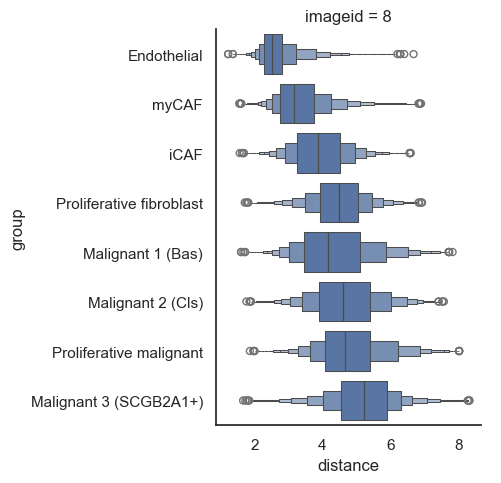

In [110]:
sm.pl.spatial_distance (adata, phenotype = 'Cell Type', spatial_distance = 'spatial_distance_CT', method='numeric', 
                        distance_from='Endothelial', imageid = 'dummy id', log = True, distance_to = ['Endothelial', 'myCAF', 'iCAF', 
                        'Proliferative fibroblast', 'Malignant 1 (Bas)', 'Malignant 2 (Cls)', 'Proliferative malignant', 
                        'Malignant 3 (SCGB2A1+)',], )

In [106]:
sm.pl.spatial_distance (adata, phenotype = 'Cell Type', spatial_distance = 'spatial_distance_CT', method='numeric', 
                        distance_from='Endothelial', imageid = 'dummy id', log = True, distance_to = ['Endothelial', 'myCAF', 'iCAF', 
                        'Proliferative fibroblast', 'Malignant 1 (Bas)', 'Malignant 2 (Cls)', 'Proliferative malignant', 
                        'Malignant 3 (SCGB2A1+)',], saveDir = outdir, fileName = 'CT Endothelial Distances.png')

Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/CT Endothelial Distances.png


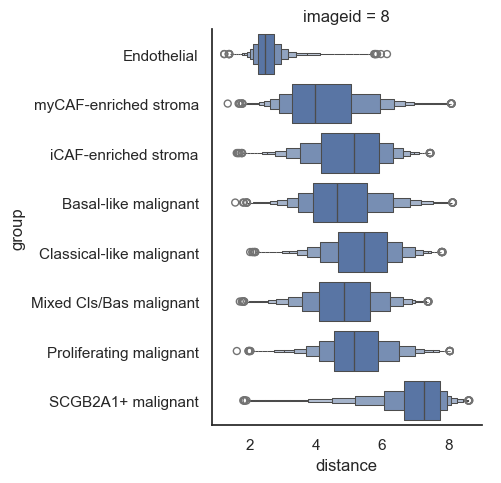

In [112]:
sm.pl.spatial_distance (adata, phenotype = 'Cellular Neighborhoods', spatial_distance = 'spatial_distance_RCN', method='numeric', 
                        distance_from='Endothelial', imageid = 'dummy id', log = True, distance_to = ['Endothelial', 'myCAF-enriched stroma',
                        'iCAF-enriched stroma', 'Basal-like malignant', 'Classical-like malignant', 'Mixed Cls/Bas malignant', 'Proliferating malignant', 
                        'SCGB2A1+ malignant'], )

In [108]:
sm.pl.spatial_distance (adata, phenotype = 'Cellular Neighborhoods', spatial_distance = 'spatial_distance_RCN', method='numeric', 
                        distance_from='Endothelial', imageid = 'dummy id', log = True, distance_to = ['Endothelial', 'myCAF-enriched stroma',
                        'iCAF-enriched stroma', 'Basal-like malignant', 'Classical-like malignant', 'Mixed Cls/Bas malignant', 'Proliferating malignant', 
                        'SCGB2A1+ malignant'], saveDir = outdir, fileName = 'CN Endothelial Distances.png')

Saved plot to /Users/cdpolt/Documents/Xenium_Pilot/CN Endothelial Distances.png
